<a href="https://colab.research.google.com/github/dr-cath/Neural_networks/blob/main/Breast_Cancer_Classification_Final_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#1. Looking At and Understanding the Data

In [ ]:
# import essential libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [ ]:
# load the dataset
data = pd.read_csv('Coimbra_breast_cancer_dataset.csv')

# check the dimension of the dataset
print(data.shape)

# view the first 5 rows of the dataset
data.head()

(116, 10)


,Age,BMI,Glucose,Insulin,HOMA,Leptin,Adiponectin,Resistin,MCP.1,Classification
0,48,23.500000,70,2.707,0.467409,8.8071,9.702400,7.99585,417.114,1
1,83,20.690495,92,3.115,0.706897,8.8438,5.429285,4.06405,468.786,1
2,82,23.124670,91,4.498,1.009651,17.9393,22.432040,9.27715,554.697,1
3,68,21.367521,77,3.226,0.612725,9.8827,7.169560,12.76600,928.220,1
4,86,21.111111,92,3.549,0.805386,6.6994,4.819240,10.57635,773.920,1


In [ ]:
# top level overview of the dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 116 entries, 0 to 115
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Age             116 non-null    int64  
 1   BMI             116 non-null    float64
 2   Glucose         116 non-null    int64  
 3   Insulin         116 non-null    float64
 4   HOMA            116 non-null    float64
 5   Leptin          116 non-null    float64
 6   Adiponectin     116 non-null    float64
 7   Resistin        116 non-null    float64
 8   MCP.1           116 non-null    float64
 9   Classification  116 non-null    int64  
dtypes: float64(7), int64(3)
memory usage: 9.2 KB


#2. Exploratory Data Analysis

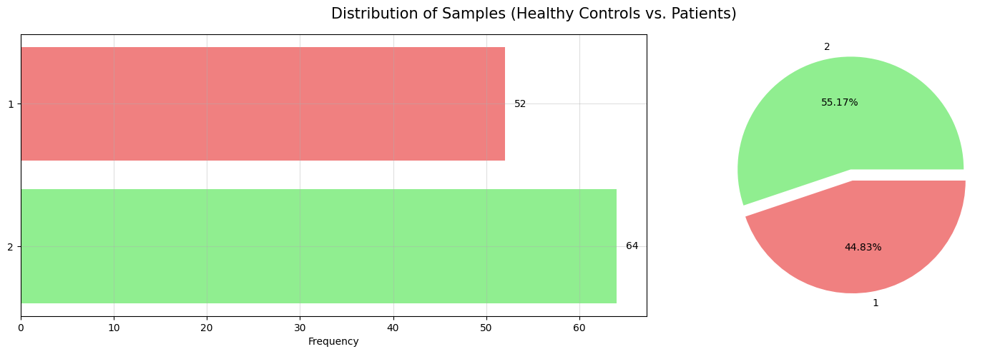

In [ ]:
# distribution of the samples by labels

labels = data['Classification'].value_counts()
colors = ['lightgreen','lightcoral']

# visualization (bar chart and pie chart)
figure, axes = plt.subplots(1,2, figsize=(15,5), gridspec_kw={'width_ratios':[1.5,1]})
axes[0].barh(y=labels.index.astype(str), width=labels.values, color=colors)
axes[0].set_xlabel('Frequency')

for index, values in enumerate(labels):
    axes[0].text(values+1, index, str(values), va='center')

axes[0].grid(alpha=0.4)

axes[1].pie(labels.values, labels=labels.index, colors=colors, explode=([0.05]*len(labels.index)), autopct='%.2f%%')
figure.suptitle('Distribution of Samples (Healthy Controls vs. Patients)', fontsize=15)
plt.tight_layout(pad=1)
plt.show()

In [ ]:
# define a helper function to perform the statistical analysis
from scipy.stats import ttest_ind

def analyzed(feature):
    # visualization (histogram and boxplot)
    figure, axes = plt.subplots(1,2, figsize=(15,5), gridspec_kw={'width_ratios':[1.5,1]})
    sns.histplot(data=data, x=data[feature], hue=data['Classification'], bins=15, palette=colors, ax=axes[0])
    axes[0].grid(alpha=0.4)
    sns.boxplot(data=data, x=data['Classification'], y=data[feature], palette=colors, ax=axes[1])
    axes[1].grid(alpha=0.4)
    figure.suptitle(f'Distribution of {feature} between Healthy Controls and Patients', fontsize=15)
    plt.tight_layout(pad=1)
    plt.show()

    # display the summary statistic
    groups = data.groupby('Classification')
    display(groups[feature].describe())

    controls = groups.get_group(1)
    patients = groups.get_group(2)

    # perform independent T-test to compare between 2 groups
    res = ttest_ind(controls[feature], patients[feature])
    test_stat = round(res[0], 4)
    pvalue = round(res[1], 4)

    print('Test statistic: ', test_stat)
    print('Test p-value: ', pvalue)

    alpha = 0.05
    if pvalue < alpha:
        print(f'Reject null hypothesis. There is a statistically significant difference of the mean {feature} between health controls and patients. Statistically significant association between {feature} and breast cancer exists in the analyzed data.')
    else:
        print(f'Failed to reject null hypothesis. Lack of evidence to conclude a statistically significant association between {feature} and breast cancer in the analyzed data.')

### Question 1 | Is there a statistically significant association between age and breast cancer, as evidenced by a difference in the age distribution between patient and control groups?

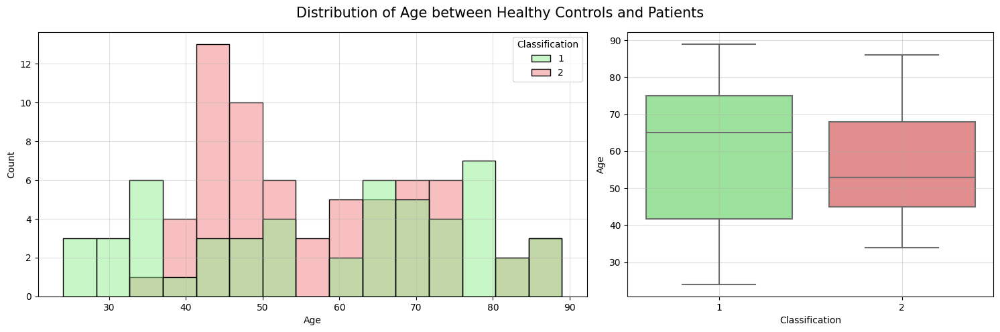

,count,mean,std,min,25%,50%,75%,max
Classification,,,,,,,,
1,52.0,58.076923,18.957999,24.0,41.75,65.0,75.0,89.0
2,64.0,56.671875,13.493155,34.0,45.00,53.0,68.0,86.0


Test statistic:  0.4655
Test p-value:  0.6425
Failed to reject null hypothesis. Lack of evidence to conclude a statistically significant association between Age and breast cancer in the analyzed data.


In [ ]:
analyzed('Age')

### Question 2 | Is there a statistically significant association between BMI and breast cancer, as evidenced by a difference in the BMI distribution between patient and control groups?

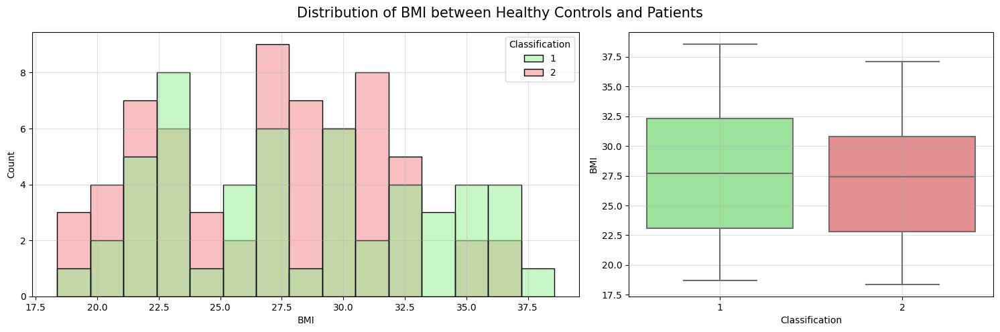

,count,mean,std,min,25%,50%,75%,max
Classification,,,,,,,,
1,52.0,28.317336,5.427465,18.67,23.096003,27.694389,32.328091,38.578759
2,64.0,26.984740,4.620398,18.37,22.788722,27.408027,30.810069,37.109375


Test statistic:  1.4282
Test p-value:  0.156
Failed to reject null hypothesis. Lack of evidence to conclude a statistically significant association between BMI and breast cancer in the analyzed data.


In [ ]:
analyzed('BMI')

### Question 3 | Is there a statistically significant association between blood glucose level and breast cancer, as evidenced by a difference in the blood glucose level between patient and control groups?

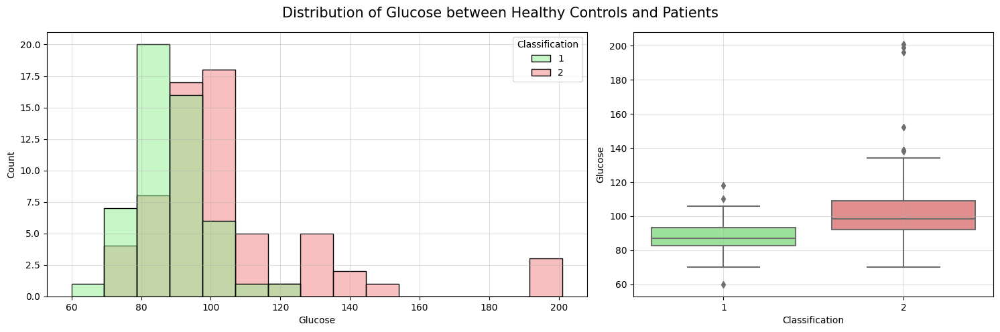

,count,mean,std,min,25%,50%,75%,max
Classification,,,,,,,,
1,52.0,88.230769,10.191529,60.0,82.75,87.0,93.25,118.0
2,64.0,105.562500,26.557440,70.0,92.00,98.5,109.00,201.0


Test statistic:  -4.4447
Test p-value:  0.0
Reject null hypothesis. There is a statistically significant difference of the mean Glucose between health controls and patients. Statistically significant association between Glucose and breast cancer exists in the analyzed data.


In [ ]:
analyzed('Glucose')

### Question 4 | Is there a statistically significant association between insulin level and breast cancer, as evidenced by a difference in the insulin level distribution between patient and control groups?

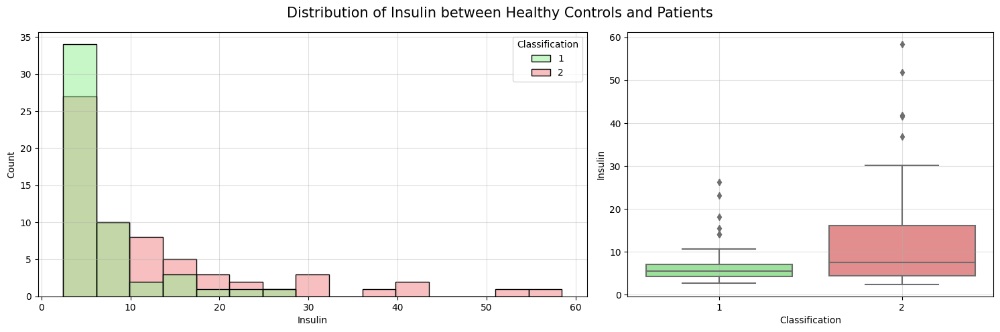

,count,mean,std,min,25%,50%,75%,max
Classification,,,,,,,,
1,52.0,6.933769,4.859793,2.707,4.304,5.4835,7.001,26.211
2,64.0,12.513219,12.317738,2.432,4.406,7.5800,16.063,58.460


Test statistic:  -3.0756
Test p-value:  0.0026
Reject null hypothesis. There is a statistically significant difference of the mean Insulin between health controls and patients. Statistically significant association between Insulin and breast cancer exists in the analyzed data.


In [ ]:
analyzed('Insulin')

### Question 5 | Is there a statistically significant association between insulin resistance and breast cancer, as evidenced by a difference in the HOMA measurement between patient and control groups?

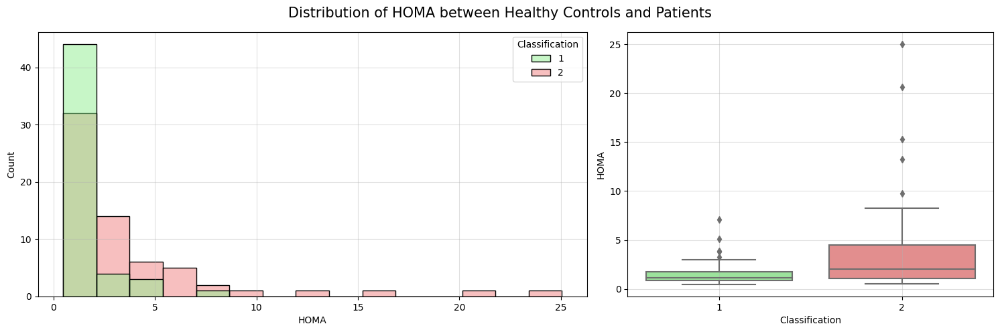

,count,mean,std,min,25%,50%,75%,max
Classification,,,,,,,,
1,52.0,1.552398,1.218256,0.467409,0.879510,1.139683,1.774561,7.111918
2,64.0,3.623342,4.588943,0.507936,1.036842,2.052256,4.461312,25.050342


Test statistic:  -3.1627
Test p-value:  0.002
Reject null hypothesis. There is a statistically significant difference of the mean HOMA between health controls and patients. Statistically significant association between HOMA and breast cancer exists in the analyzed data.


In [ ]:
analyzed('HOMA')

### Question 6 | Is there a statistically significant association between leptin levels and breast cancer, as evidenced by a difference in the leptin level distribution between patient and control groups?

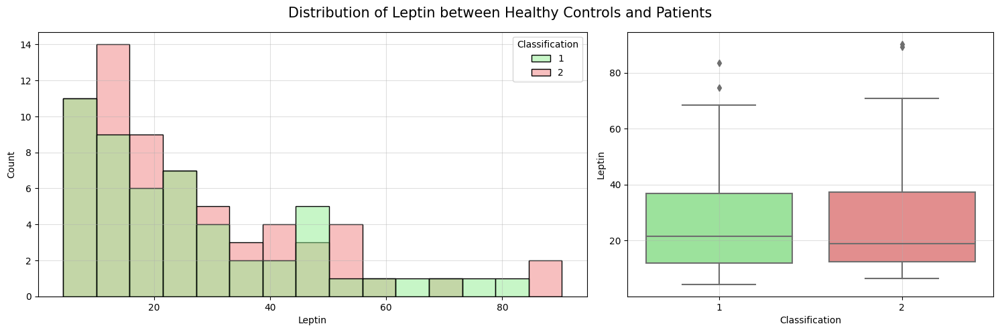

,count,mean,std,min,25%,50%,75%,max
Classification,,,,,,,,
1,52.0,26.637933,19.334699,4.3110,11.845750,21.49485,36.7216,83.4821
2,64.0,26.596512,19.212451,6.3339,12.402925,18.87765,37.3783,90.2800


Test statistic:  0.0115
Test p-value:  0.9908
Failed to reject null hypothesis. Lack of evidence to conclude a statistically significant association between Leptin and breast cancer in the analyzed data.


In [ ]:
analyzed('Leptin')

### Question 7 | Is there a statistically significant association between adiponectin and breast cancer, as evidenced by a difference in the adiponectin level distribution between patient and control groups?

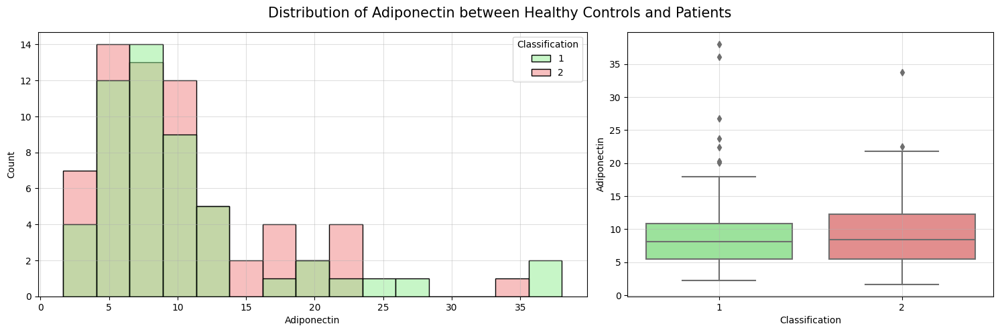

,count,mean,std,min,25%,50%,75%,max
Classification,,,,,,,,
1,52.0,10.328205,7.631281,2.19428,5.454286,8.127775,10.820219,38.04
2,64.0,10.061167,6.189466,1.65602,5.484117,8.446438,12.254740,33.75


Test statistic:  0.2081
Test p-value:  0.8355
Failed to reject null hypothesis. Lack of evidence to conclude a statistically significant association between Adiponectin and breast cancer in the analyzed data.


In [ ]:
analyzed('Adiponectin')

### Question 8 | Is there a statistically significant association between resistin levels and breast cancer, as evidenced by a difference in the resistin level distribution between patient and control groups?

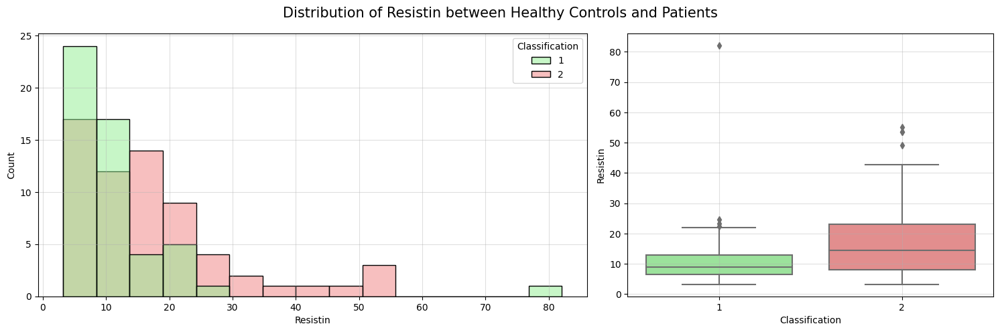

,count,mean,std,min,25%,50%,75%,max
Classification,,,,,,,,
1,52.0,11.614813,11.447053,3.29175,6.597523,8.929190,12.808525,82.1000
2,64.0,17.253777,12.636979,3.21000,8.113675,14.371825,22.965170,55.2153


Test statistic:  -2.4923
Test p-value:  0.0141
Reject null hypothesis. There is a statistically significant difference of the mean Resistin between health controls and patients. Statistically significant association between Resistin and breast cancer exists in the analyzed data.


In [ ]:
analyzed('Resistin')

### Question 9 | Is there a statistically significant association between monocyte chemoattractant Protein-1 (MCP-1) level and breast cancer, as evidenced by a difference in the MCP-1 level distribution between patient and control groups?

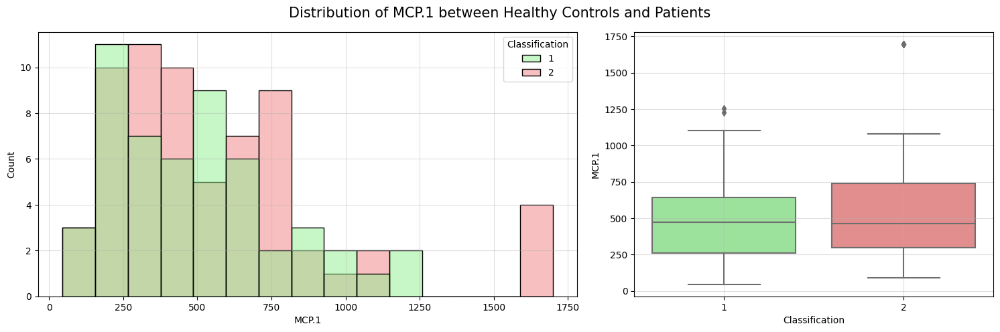

,count,mean,std,min,25%,50%,75%,max
Classification,,,,,,,,
1,52.0,499.730692,292.242157,45.843,260.73650,471.3225,642.9335,1256.083
2,64.0,563.016500,384.001622,90.090,299.18825,465.3740,737.7625,1698.440


Test statistic:  -0.9798
Test p-value:  0.3293
Failed to reject null hypothesis. Lack of evidence to conclude a statistically significant association between MCP.1 and breast cancer in the analyzed data.


In [ ]:
analyzed('MCP.1')

### Question 10 | Is there a correlation between various features in the samples?

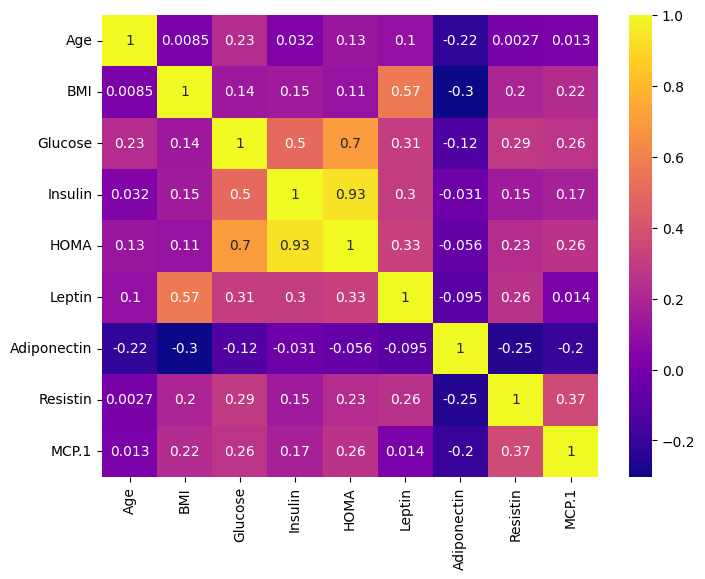

In [ ]:
# calculate the Pearson's correlation between features
fil_df = data.drop(columns=['Classification'], axis=1)
correlation = fil_df.corr()

# visualize the correlation in heatmap
plt.figure(figsize=(8,6))
sns.heatmap(correlation, annot=True, cmap='plasma')
plt.show()

# 3. Constructing a Decision Tree

### Data Preprocessing

In [ ]:
from sklearn.model_selection import train_test_split

# split the dataset into training and test data (80:20 ratio)
train, test = train_test_split(data, test_size=0.2, random_state=122)

# check the dimension of the train and test data
print('Training data: ', train.shape)
print('Test data: ', test.shape)

Training data:  (92, 10)
Test data:  (24, 10)


In [ ]:
# segregate the feature matrix and target vector from train and test data
Xtrain = train.drop(columns=['Classification'], axis=1)
ytrain = train['Classification']

Xtest = test.drop(columns=['Classification'], axis=1)
ytest = test['Classification']

In [ ]:
# scale the training and test data
from sklearn.preprocessing import MinMaxScaler

# initialize a MinMaxScaler object
scaler = MinMaxScaler()
Xtrain_scaled = scaler.fit_transform(Xtrain)
Xtest_scaled = scaler.transform(Xtest)

### Initializing and Running the Model

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

# create a Decision Tree Classifier
tree = DecisionTreeClassifier(random_state=122)

# Define the hyperparameter grid
param_grid = {
    'criterion': ['gini', 'entropy'],
    'splitter': ['best', 'random'],
    'max_depth': [10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [2, 4]
}

# create the GridSearchCV object
grid_search_tree = GridSearchCV(tree, param_grid, cv=5, scoring='accuracy', n_jobs=-1)

# fit the grid search to the data
grid_search_tree.fit(Xtrain_scaled, ytrain)

# print the best parameters and the corresponding accuracy
print('Best Parameters: ', grid_search_tree.best_params_)
print('Best Accuracy: ', grid_search_tree.best_score_)

# get the best model
best_tree = grid_search_tree.best_estimator_

Best Parameters:  {'criterion': 'entropy', 'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 5, 'splitter': 'random'}
Best Accuracy:  0.7064327485380117


In [ ]:
# evaluate the best model on the test set
test_accuracy = best_tree.score(Xtest_scaled, ytest)
print('Test Accuracy: ', test_accuracy)

Test Accuracy:  0.75


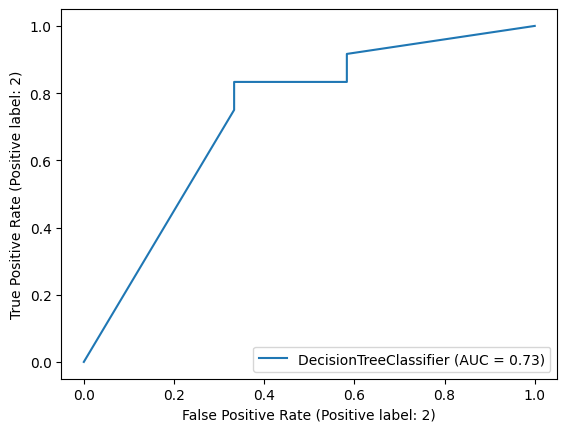

In [ ]:
from sklearn.metrics import RocCurveDisplay

# check the ROC AUC curve
RocCurveDisplay.from_estimator(best_tree, Xtest_scaled, ytest)
plt.show()

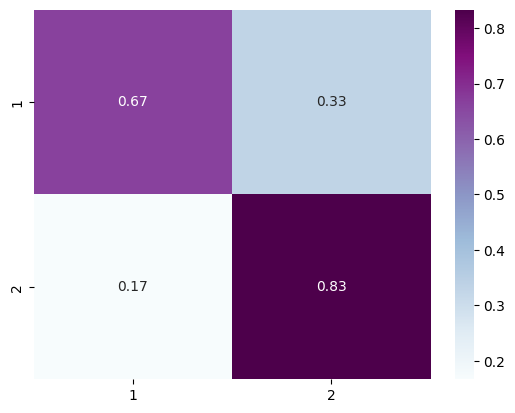

In [ ]:
# visualize the confusion matrix using a heatmap
from sklearn.metrics import confusion_matrix

ypred_tree = best_tree.predict(Xtest_scaled)

labels = ytest.unique()

cm_tree = confusion_matrix(ytest, ypred_tree, normalize='true')
plt.figure()
sns.heatmap(cm_tree, annot=True, cmap='BuPu', xticklabels=labels, yticklabels=labels)
plt.show()

In [ ]:
# classification report
from sklearn.metrics import classification_report

tree_report = classification_report(ytest, ypred_tree)
print(tree_report)

              precision    recall  f1-score   support

           1       0.80      0.67      0.73        12
           2       0.71      0.83      0.77        12

    accuracy                           0.75        24
   macro avg       0.76      0.75      0.75        24
weighted avg       0.76      0.75      0.75        24



#4. Constructing a Logistic Regression Model

In [ ]:
from sklearn.linear_model import LogisticRegression

# create a logistic regression Classifier
logreg = LogisticRegression(random_state=122, max_iter=5000)

# define the hyperparameter grid
param_grid = {
    'penalty': ['l1', 'l2'],
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'solver': ['liblinear', 'saga']
}

# create the GridSearchCV object
grid_search_logreg = GridSearchCV(logreg, param_grid, cv=5, scoring='accuracy', n_jobs=-1)

# fit the grid search to the data
grid_search_logreg.fit(Xtrain_scaled, ytrain)

# print the best parameters and the corresponding accuracy
print('Best Parameters: ', grid_search_logreg.best_params_)
print('Best Accuracy: ', grid_search_logreg.best_score_)

# get the best model
best_logreg = grid_search_logreg.best_estimator_

Best Parameters:  {'C': 10, 'penalty': 'l2', 'solver': 'liblinear'}
Best Accuracy:  0.7707602339181286


In [ ]:
# evaluate the best model on the test set
test_accuracy = best_logreg.score(Xtest_scaled, ytest)
print('Test Accuracy: ', test_accuracy)

Test Accuracy:  0.6666666666666666


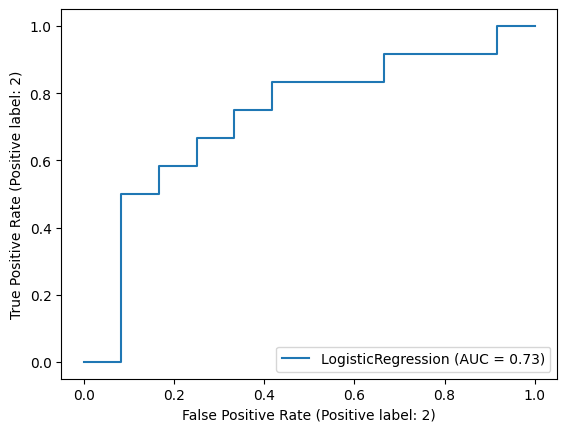

In [ ]:
# check the ROC AUC curve

RocCurveDisplay.from_estimator(best_logreg, Xtest_scaled, ytest)
plt.show()

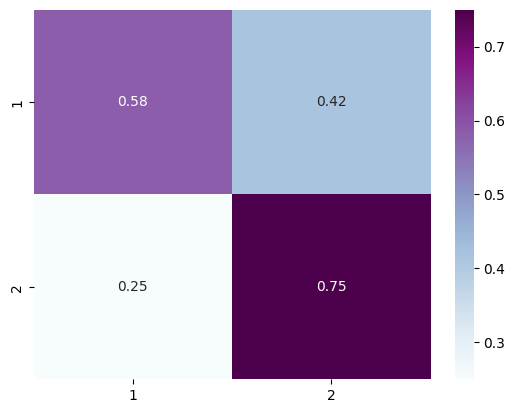

In [ ]:
# visualize the confusion matrix using a heatmap
ypred_lr = best_logreg.predict(Xtest_scaled)

labels = ytest.unique()

cm_logistic = confusion_matrix(ytest, ypred_lr, normalize='true')
plt.figure()
sns.heatmap(cm_logistic, annot=True, cmap='BuPu', xticklabels=labels, yticklabels=labels)
plt.show()

In [ ]:
# classification report
print(classification_report(ytest, ypred_lr))

              precision    recall  f1-score   support

           1       0.70      0.58      0.64        12
           2       0.64      0.75      0.69        12

    accuracy                           0.67        24
   macro avg       0.67      0.67      0.66        24
weighted avg       0.67      0.67      0.66        24



#4. Constructing a Decision Tree with Significant Feature Context

Feature Selection Based on Significance of Effect from Exploratory Data Analysis

In [ ]:
# subset the features statistically significant to target labels
imp_feats = ['Glucose','Insulin','Resistin']

fil_data = data[imp_feats]

In [ ]:
# split the filtered dataset into training and test data (80:20 ratio)
Xtrain_fil, Xtest_fil, ytrain_fil, ytest_fil = train_test_split(fil_data, data['Classification'], test_size=0.2, random_state=122)

In [ ]:
# initialize a MinMaxScaler object
scaler2 = MinMaxScaler()
Xtrain_scaled2 = scaler2.fit_transform(Xtrain_fil)
Xtest_scaled2 = scaler2.transform(Xtest_fil)

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

# create a Decision Tree Classifier
tree = DecisionTreeClassifier(random_state=122)

# Define the hyperparameter grid
param_grid = {
    'criterion': ['gini', 'entropy'],
    'splitter': ['best', 'random'],
    'max_depth': [10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [2, 4]
}

# create the GridSearchCV object
grid_search_tree2 = GridSearchCV(tree, param_grid, cv=5, scoring='accuracy', n_jobs=-1)

# fit the grid search to the data
grid_search_tree2.fit(Xtrain_scaled2, ytrain_fil)

# print the best parameters and the corresponding accuracy
print('Best Parameters: ', grid_search_tree2.best_params_)
print('Best Accuracy: ', grid_search_tree2.best_score_)

# get the best model
best_tree2 = grid_search_tree2.best_estimator_

Best Parameters:  {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10, 'splitter': 'random'}
Best Accuracy:  0.7181286549707602


In [ ]:
# evaluate the best model on the test set
test_accuracy = best_tree2.score(Xtest_scaled2, ytest_fil)
print('Test Accuracy: ', test_accuracy)

Test Accuracy:  0.5833333333333334


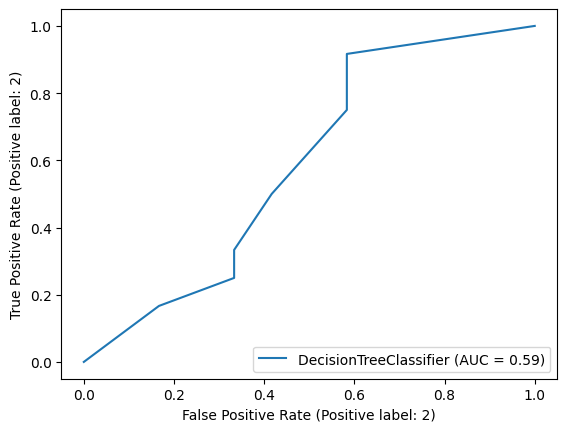

In [ ]:
# check the ROC AUC curve
RocCurveDisplay.from_estimator(best_tree2, Xtest_scaled2, ytest_fil)
plt.show()

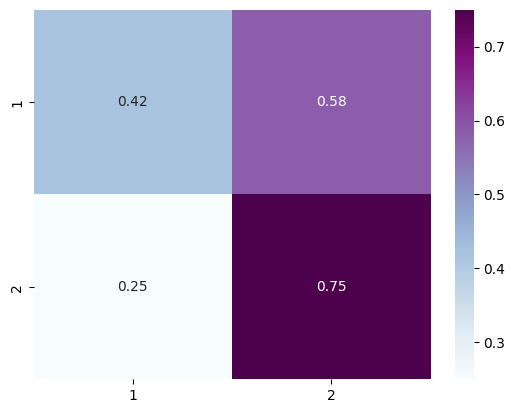

In [ ]:
# confusion matrix
ypred_tree2 = best_tree2.predict(Xtest_scaled2)

labels = ytest.unique()

cm_tree2 = confusion_matrix(ytest_fil, ypred_tree2, normalize='true')
plt.figure()
sns.heatmap(cm_tree2, annot=True, cmap='BuPu', xticklabels=labels, yticklabels=labels)
plt.show()

In [ ]:
# classification report
tree_report2 = classification_report(ytest_fil, ypred_tree2)
print(tree_report2)

              precision    recall  f1-score   support

           1       0.62      0.42      0.50        12
           2       0.56      0.75      0.64        12

    accuracy                           0.58        24
   macro avg       0.59      0.58      0.57        24
weighted avg       0.59      0.58      0.57        24



# 4. Constructing a Logistic Regression Model with Significant Feature Context

In [ ]:
from sklearn.linear_model import LogisticRegression

# create a logistic regression Classifier
logreg = LogisticRegression(random_state=122, max_iter=5000)

# define the hyperparameter grid
param_grid = {
    'penalty': ['l1', 'l2'],
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'solver': ['liblinear', 'saga']
}

# create the GridSearchCV object
grid_search_logreg2 = GridSearchCV(logreg, param_grid, cv=5, scoring='accuracy', n_jobs=-1)

# fit the grid search to the data
grid_search_logreg2.fit(Xtrain_scaled2, ytrain_fil)

# print the best parameters and the corresponding accuracy
print('Best Parameters: ', grid_search_logreg2.best_params_)
print('Best Accuracy: ', grid_search_logreg2.best_score_)

# get the best model
best_logreg2 = grid_search_logreg2.best_estimator_

Best Parameters:  {'C': 10, 'penalty': 'l1', 'solver': 'liblinear'}
Best Accuracy:  0.7608187134502924


In [ ]:
# evaluate the best model on the test set
test_accuracy = best_logreg2.score(Xtest_scaled2, ytest_fil)
print('Test Accuracy: ', test_accuracy)

Test Accuracy:  0.6666666666666666


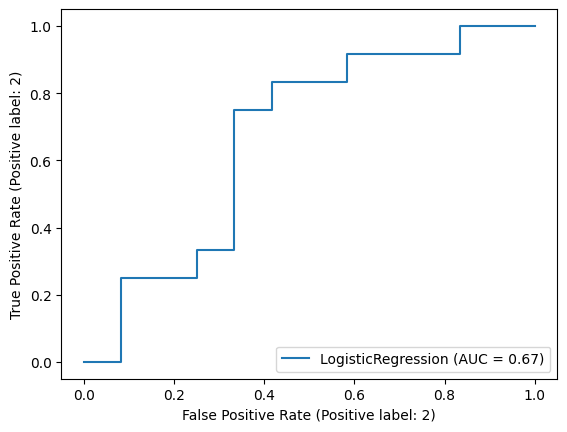

In [ ]:
# check the ROC AUC curve

RocCurveDisplay.from_estimator(best_logreg2, Xtest_scaled2, ytest_fil)
plt.show()

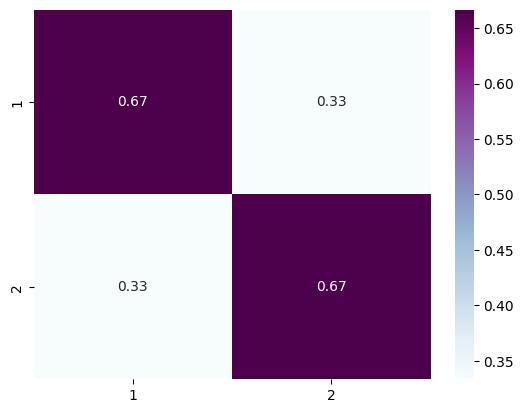

In [ ]:
# visualize the confusion matrix using a heatmap
ypred_lr2 = best_logreg2.predict(Xtest_scaled2)

labels = ytest.unique()

cm_logistic2 = confusion_matrix(ytest_fil, ypred_lr2, normalize='true')
plt.figure()
sns.heatmap(cm_logistic2, annot=True, cmap='BuPu', xticklabels=labels, yticklabels=labels)
plt.show()

In [ ]:
# classification report
print(classification_report(ytest_fil, ypred_lr2))

              precision    recall  f1-score   support

           1       0.67      0.67      0.67        12
           2       0.67      0.67      0.67        12

    accuracy                           0.67        24
   macro avg       0.67      0.67      0.67        24
weighted avg       0.67      0.67      0.67        24



# 5. Constructing a Neural Network

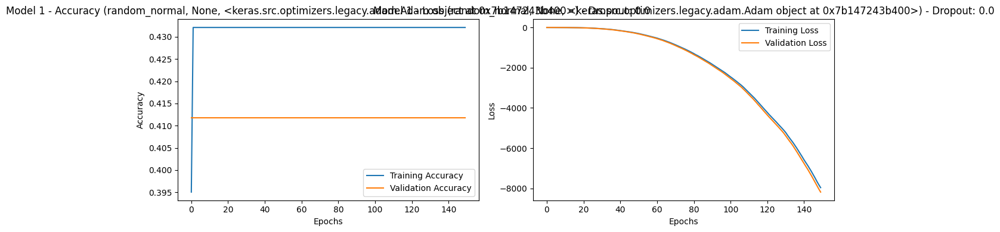

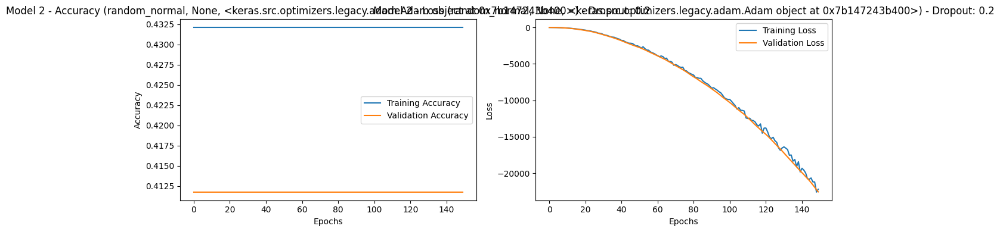

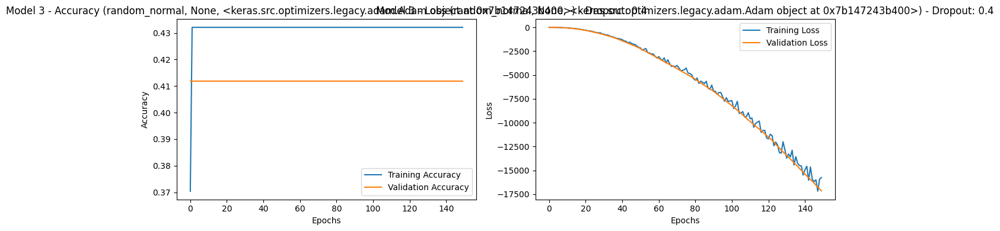

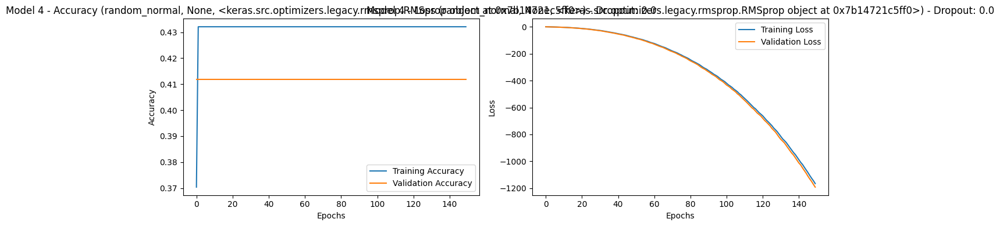

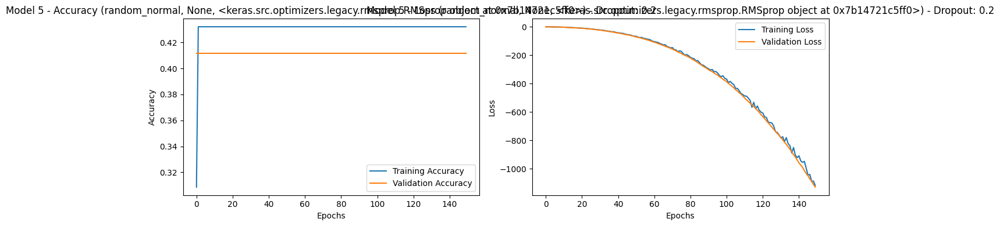

...

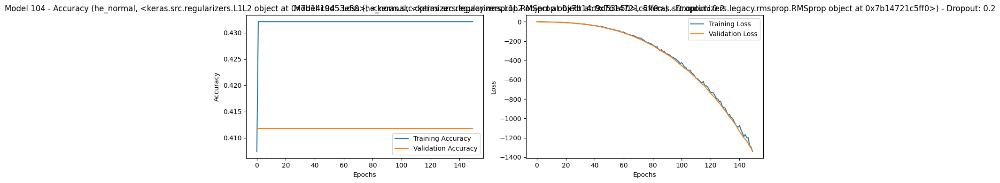

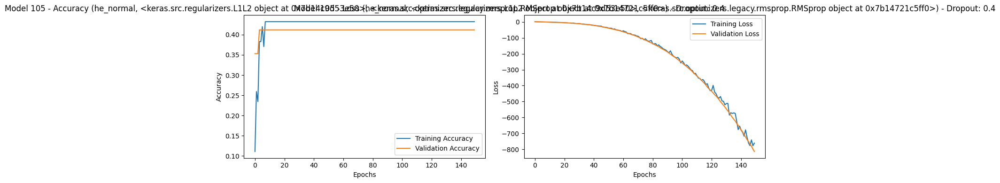

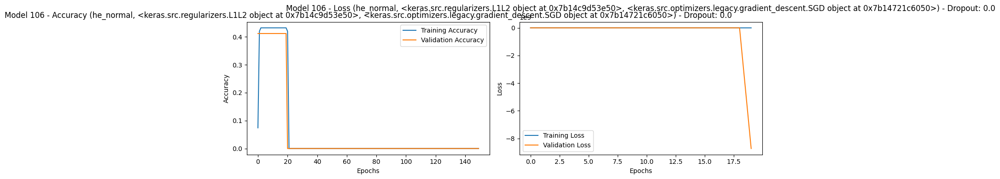

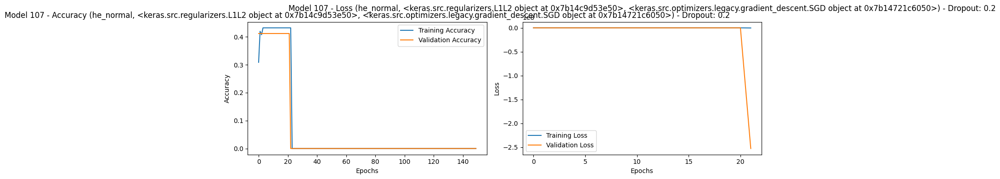

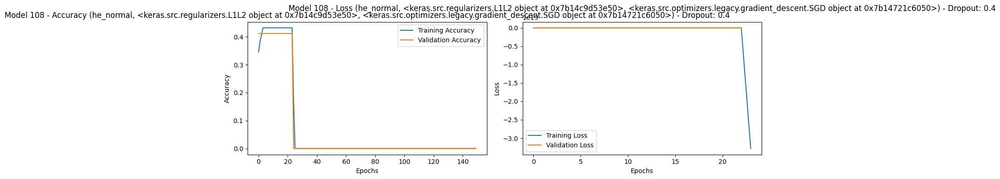

In [ ]:
# Selecting features and target
features = ['Age', 'BMI', 'Glucose', 'Insulin', 'HOMA', 'Leptin', 'Adiponectin', 'Resistin', 'MCP.1']
target = 'Classification'

X = data[features].values
y = data[target].values

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
# Splitting the data into train, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Standardizing features
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)
X_test = scaler.transform(X_test)

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras import regularizers, optimizers, initializers
from tensorflow.keras.optimizers import legacy
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Dropout

# Function to create a model
def create_model_with_dropout(init, reg, opt, dropout_rate=0.2):
    model = Sequential()
    model.add(Dense(64, input_shape=(X_train.shape[1],), activation='relu', kernel_initializer=init, kernel_regularizer=reg))
    model.add(Dropout(dropout_rate))  # Adding dropout after the first hidden layer
    model.add(Dense(32, activation='relu', kernel_initializer=init, kernel_regularizer=reg))
    model.add(Dropout(dropout_rate))  # Adding dropout after the second hidden layer
    model.add(Dense(1, activation='sigmoid'))  # Final output layer for binary classification

    model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Define lists for different initialization, regularization, and optimization techniques
initializations = ['random_normal', 'glorot_normal', 'he_normal']
regularizations = [None, regularizers.l1(0.001), regularizers.l2(0.001), regularizers.l1_l2(l1=0.001, l2=0.001)]
optimizers_list = [legacy.Adam(), legacy.RMSprop(), legacy.SGD()]
# Define lists for different initialization, regularization, and optimization techniques
dropout_rates = [0.0, 0.2, 0.4]  # Define different dropout rates to try

# Create models with dropout and store their performance
history_dropout = []

for init in initializations:
    for reg in regularizations:
        for opt in optimizers_list:
            for dropout_rate in dropout_rates:
                model = create_model_with_dropout(init, reg, opt, dropout_rate)
                hist = model.fit(X_train, y_train, epochs=150, batch_size=16, validation_data=(X_val, y_val), verbose=0)
                history_dropout.append((init, reg, opt, dropout_rate, hist))

# Plotting accuracy and loss for each model with dropout
for i, hist in enumerate(history_dropout):
    init, reg, opt, dropout_rate, hist_data = hist
    plt.figure(figsize=(12, 4))

    # Accuracy plot
    plt.subplot(1, 2, 1)
    plt.plot(hist_data.history['accuracy'], label='Training Accuracy')
    plt.plot(hist_data.history['val_accuracy'], label='Validation Accuracy')
    plt.title(f'Model {i+1} - Accuracy ({init}, {reg}, {opt}) - Dropout: {dropout_rate}')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss plot
    plt.subplot(1, 2, 2)
    plt.plot(hist_data.history['loss'], label='Training Loss')
    plt.plot(hist_data.history['val_loss'], label='Validation Loss')
    plt.title(f'Model {i+1} - Loss ({init}, {reg}, {opt}) - Dropout: {dropout_rate}')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

In [ ]:
def select_best_model(history_data):
    best_model = None
    best_val_accuracy = 0.0

    for i, hist in enumerate(history_data):
        init, reg, opt, dropout_rate, hist_data = hist

        val_accuracy = max(hist_data.history['val_accuracy'])

        # Check for overfitting by comparing training and validation loss
        train_loss = hist_data.history['loss']
        val_loss = hist_data.history['val_loss']
        min_loss_idx = val_loss.index(min(val_loss))

        # Considering overfitting when training loss is much lower than validation loss
        if min_loss_idx != 0 and min_loss_idx != len(val_loss) - 1:
            if train_loss[min_loss_idx] * 0.9 > val_loss[min_loss_idx]:
                continue  # Skip this model if overfitting is detected

        if val_accuracy > best_val_accuracy:
            best_val_accuracy = val_accuracy
            best_model = hist

    return best_model


best_model_config = select_best_model(history_dropout)
print("Best Model Configuration:")
print("Initialization:", best_model_config[0])
print("Regularization:", best_model_config[1])
print("Optimizer:", best_model_config[2])
print("Dropout Rate:", best_model_config[3])

Best Model Configuration:
Initialization: random_normal
Regularization: None
Optimizer: <keras.src.optimizers.legacy.adam.Adam object at 0x7b147243b400>
Dropout Rate: 0.0


Epoch 1/150
6/6 [==============================] - 1s 84ms/step - loss: 0.6636 - accuracy: 0.4198 - val_loss: 0.6305 - val_accuracy: 0.4118
Epoch 2/150
6/6 [==============================] - 0s 15ms/step - loss: 0.6113 - accuracy: 0.4321 - val_loss: 0.5737 - val_accuracy: 0.4118
Epoch 3/150
6/6 [==============================] - 0s 16ms/step - loss: 0.5455 - accuracy: 0.4321 - val_loss: 0.4938 - val_accuracy: 0.4118
Epoch 4/150
6/6 [==============================] - 0s 21ms/step - loss: 0.4550 - accuracy: 0.4321 - val_loss: 0.3786 - val_accuracy: 0.4118
Epoch 5/150
6/6 [==============================] - 0s 17ms/step - loss: 0.3236 - accuracy: 0.4321 - val_loss: 0.2193 - val_accuracy: 0.4118
Epoch 6/150
6/6 [==============================] - 0s 25ms/step - loss: 0.1436 - accuracy: 0.4321 - val_loss: 0.0060 - val_accuracy: 0.4118
Epoch 7/150
6/6 [==============================] - 0s 28ms/step - loss: -0.0934 - accuracy: 0.4321 - val_loss: -0.2588 - val_accuracy: 0.4118
Epoch 8/150
6/6 [=

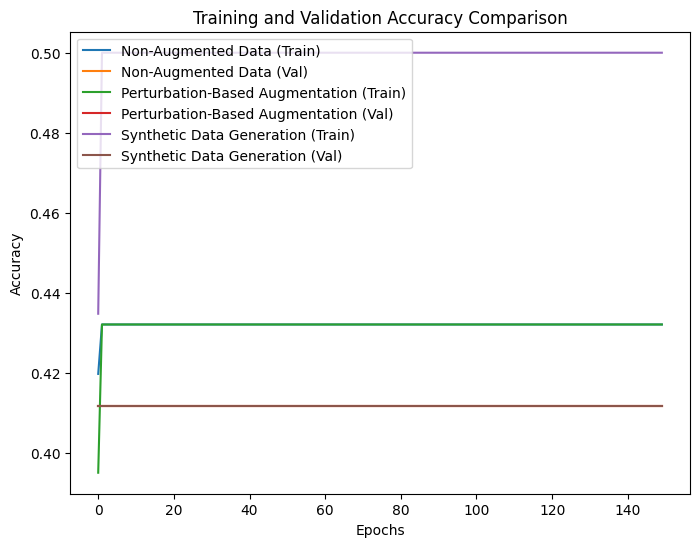

In [ ]:
from sklearn.utils import shuffle
# Selecting features and target
features = ['Age', 'BMI', 'Glucose', 'Insulin', 'HOMA', 'Leptin', 'Adiponectin', 'Resistin', 'MCP.1']
target = 'Classification'

X = data[features].values
y = data[target].values

# Splitting the data into train, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Standardizing features
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)
X_test = scaler.transform(X_test)

def perturb_data(data, columns, scale=0.05):
    perturbed = data.copy()
    col_indices = [features.index(col) for col in columns]  # Get column indices
    for col_idx in col_indices:
        perturbed[:, col_idx] += np.random.normal(0, scale, size=len(perturbed))
    return perturbed


from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

model_nonaugmented = Sequential()
model_nonaugmented.add(Dense(64, input_shape=(X_train.shape[1],), activation='relu', kernel_initializer='random_normal', kernel_regularizer=None))
model_nonaugmented.add(Dense(32, activation='relu', kernel_initializer='random_normal', kernel_regularizer=None))
model_nonaugmented.add(Dense(1, activation='sigmoid'))  # Final output layer for binary classification
model_nonaugmented.compile(optimizer=legacy.Adam(), loss='binary_crossentropy', metrics=['accuracy'])

history_nonaugmented = model_nonaugmented.fit(X_train, y_train, epochs=150, batch_size=16, validation_data=(X_val, y_val))

augmented_data_perturb = perturb_data(X_train, features)

# Combine original and perturbed data
augmented_X_train_perturb = np.vstack((X_train, augmented_data_perturb))
augmented_y_train_perturb = np.concatenate((y_train, y_train))  # Use original labels for augmented data

# Shuffle the combined data
augmented_X_train_perturb, augmented_y_train_perturb = shuffle(augmented_X_train_perturb, augmented_y_train_perturb, random_state=42)

model_perturbation = Sequential()
model_perturbation.add(Dense(64, input_shape=(X_train.shape[1],), activation='relu', kernel_initializer='random_normal', kernel_regularizer=None))
model_perturbation.add(Dense(32, activation='relu', kernel_initializer='random_normal', kernel_regularizer=None))
model_perturbation.add(Dense(1, activation='sigmoid'))  # Final output layer for binary classification
model_perturbation.compile(optimizer=legacy.Adam(), loss='binary_crossentropy', metrics=['accuracy'])

history_perturbation = model_perturbation.fit(augmented_X_train_perturb, augmented_y_train_perturb, epochs=150, batch_size=16, validation_data=(X_val, y_val))

model_synthetic = Sequential()
model_synthetic.add(Dense(64, input_shape=(X_train.shape[1],), activation='relu', kernel_initializer='random_normal', kernel_regularizer=None))
model_synthetic.add(Dense(32, activation='relu', kernel_initializer='random_normal', kernel_regularizer=None))
model_synthetic.add(Dense(1, activation='sigmoid'))  # Final output layer for binary classification
model_synthetic.compile(optimizer=legacy.Adam(), loss='binary_crossentropy', metrics=['accuracy'])

history_synthetic = model_synthetic.fit(X_train_resampled, y_train_resampled, epochs=150, batch_size=16, validation_data=(X_val, y_val))

# Evaluate model accuracy on test sets
accuracy_non_augmented = model_nonaugmented.evaluate(X_test, y_test, verbose=0)[1]
accuracy_perturbation = model_perturbation.evaluate(X_test, y_test, verbose=0)[1]
accuracy_synthetic = model_synthetic.evaluate(X_test, y_test, verbose=0)[1]

print(f'Accuracy - Non-Augmented Data: {accuracy_non_augmented * 100:.2f}%')
print(f'Accuracy - Perturbation-Based Augmentation: {accuracy_perturbation * 100:.2f}%')
print(f'Accuracy - Synthetic Data Generation: {accuracy_synthetic * 100:.2f}%')

# Plot training history to monitor overfitting
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))

plt.plot(history_nonaugmented.history['accuracy'], label='Non-Augmented Data (Train)')
plt.plot(history_nonaugmented.history['val_accuracy'], label='Non-Augmented Data (Val)')
plt.plot(history_perturbation.history['accuracy'], label='Perturbation-Based Augmentation (Train)')
plt.plot(history_perturbation.history['val_accuracy'], label='Perturbation-Based Augmentation (Val)')
plt.plot(history_synthetic.history['accuracy'], label='Synthetic Data Generation (Train)')
plt.plot(history_synthetic.history['val_accuracy'], label='Synthetic Data Generation (Val)')

plt.title('Training and Validation Accuracy Comparison')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()